#### BASE DE CARROS

In [1]:
import pandas as pd
import numpy as np
import torch
import seaborn as sns
from torch import nn, optim
import torch.nn.functional as F

In [54]:
np.random.seed(123)
torch.manual_seed(123)

In [55]:
base = pd.read_csv("./arquivos/autos.csv", encoding='ISO-8859-1')
base

,dateCrawled,name,seller,offerType,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage,dateCreated,nrOfPictures,postalCode,lastSeen
0,2016-03-24 11:52:17,Golf_3_1.6,privat,Angebot,480,test,NaN,1993,manuell,0,golf,150000,0,benzin,volkswagen,NaN,2016-03-24 00:00:00,0,70435,2016-04-07 03:16:57
1,2016-03-24 10:58:45,A5_Sportback_2.7_Tdi,privat,Angebot,18300,test,coupe,2011,manuell,190,NaN,125000,5,diesel,audi,ja,2016-03-24 00:00:00,0,66954,2016-04-07 01:46:50
2,2016-03-14 12:52:21,"Jeep_Grand_Cherokee_""Overland""",privat,Angebot,9800,test,suv,2004,automatik,163,grand,125000,8,diesel,jeep,NaN,2016-03-14 00:00:00,0,90480,2016-04-05 12:47:46
3,2016-03-17 16:54:04,GOLF_4_1_4__3Tï¿½RER,privat,Angebot,1500,test,kleinwagen,2001,manuell,75,golf,150000,6,benzin,volkswagen,nein,2016-03-17 00:00:00,0,91074,2016-03-17 17:40:17
4,2016-03-31 17:25:20,Skoda_Fabia_1.4_TDI_PD_Classic,privat,Angebot,3600,test,kleinwagen,2008,manuell,69,fabia,90000,7,diesel,skoda,nein,2016-03-31 00:00:00,0,60437,2016-04-06 10:17:21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371523,2016-03-14 17:48:27,Suche_t4___vito_ab_6_sitze,privat,Angebot,2200,test,NaN,2005,NaN,0,NaN,20000,1,NaN,sonstige_autos,NaN,2016-03-14 00:00:00,0,39576,2016-04-06 00:46:52
371524,2016-03-05 19:56:21,Smart_smart_leistungssteigerung_100ps,privat,Angebot,1199,test,cabrio,2000,automatik,101,fortwo,125000,3,benzin,smart,nein,2016-03-05 00:00:00,0,26135,2016-03-11 18:17:12
371525,2016-03-19 18:57:12,Volkswagen_Multivan_T4_TDI_7DC_UY2,privat,Angebot,9200,test,bus,1996,manuell,102,transporter,150000,3,diesel,volkswagen,nein,2016-03-19 00:00:00,0,87439,2016-04-07 07:15:26
371526,2016-03-20 19:41:08,VW_Golf_Kombi_1_9l_TDI,privat,Angebot,3400,test,kombi,2002,manuell,100,golf,150000,6,diesel,volkswagen,NaN,2016-03-20 00:00:00,0,40764,2016-03-24 12:45:21


In [56]:
base = base.drop('dateCrawled', axis = 1)
base = base.drop('dateCreated', axis = 1)
base = base.drop('nrOfPictures', axis = 1)
base = base.drop('postalCode', axis = 1)
base = base.drop('lastSeen', axis = 1)
base

,name,seller,offerType,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage
0,Golf_3_1.6,privat,Angebot,480,test,NaN,1993,manuell,0,golf,150000,0,benzin,volkswagen,NaN
1,A5_Sportback_2.7_Tdi,privat,Angebot,18300,test,coupe,2011,manuell,190,NaN,125000,5,diesel,audi,ja
2,"Jeep_Grand_Cherokee_""Overland""",privat,Angebot,9800,test,suv,2004,automatik,163,grand,125000,8,diesel,jeep,NaN
3,GOLF_4_1_4__3Tï¿½RER,privat,Angebot,1500,test,kleinwagen,2001,manuell,75,golf,150000,6,benzin,volkswagen,nein
4,Skoda_Fabia_1.4_TDI_PD_Classic,privat,Angebot,3600,test,kleinwagen,2008,manuell,69,fabia,90000,7,diesel,skoda,nein
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371523,Suche_t4___vito_ab_6_sitze,privat,Angebot,2200,test,NaN,2005,NaN,0,NaN,20000,1,NaN,sonstige_autos,NaN
371524,Smart_smart_leistungssteigerung_100ps,privat,Angebot,1199,test,cabrio,2000,automatik,101,fortwo,125000,3,benzin,smart,nein
371525,Volkswagen_Multivan_T4_TDI_7DC_UY2,privat,Angebot,9200,test,bus,1996,manuell,102,transporter,150000,3,diesel,volkswagen,nein
371526,VW_Golf_Kombi_1_9l_TDI,privat,Angebot,3400,test,kombi,2002,manuell,100,golf,150000,6,diesel,volkswagen,NaN


In [57]:
base['name'].value_counts()

Ford_Fiesta                                                657
BMW_318i                                                   627
Opel_Corsa                                                 622
Volkswagen_Golf_1.4                                        603
BMW_316i                                                   523
                                                          ... 
Audi_A4_Avant_Klima_Gruene_Plakette_Tï¿½V_&AU_NEU_XENON      1
Renault_clio_in_gold_450VB_!!                                1
Fiat_Doblo_1.6_Multijet                                      1
Renault_Laguna_1                                             1
BMW_M135i_vollausgestattet_NP_52.720____Euro                 1
Name: name, Length: 233528, dtype: int64

In [58]:
base = base.drop('name', axis=1)
base = base.drop('seller', axis=1)
base = base.drop('offerType', axis=1)

In [59]:
i1 = base.loc[base.price <= 10]
i1

,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage
7,0,test,limousine,1980,manuell,50,andere,40000,7,benzin,volkswagen,nein
40,0,test,NaN,1990,NaN,0,corsa,150000,1,benzin,opel,NaN
60,1,control,suv,1994,manuell,286,NaN,150000,11,NaN,sonstige_autos,NaN
91,1,control,limousine,1995,manuell,113,e_klasse,150000,4,diesel,mercedes_benz,nein
115,0,test,NaN,2017,manuell,0,golf,5000,12,benzin,volkswagen,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
371356,0,control,NaN,2000,manuell,65,corsa,150000,0,NaN,opel,ja
371392,0,test,kleinwagen,2002,manuell,60,fiesta,150000,3,benzin,ford,NaN
371402,0,control,kleinwagen,1999,manuell,53,swift,150000,3,benzin,suzuki,NaN
371431,0,control,kleinwagen,1999,manuell,37,arosa,150000,7,benzin,seat,ja


In [60]:
base = base[base.price>10]

In [61]:
base

,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage
0,480,test,NaN,1993,manuell,0,golf,150000,0,benzin,volkswagen,NaN
1,18300,test,coupe,2011,manuell,190,NaN,125000,5,diesel,audi,ja
2,9800,test,suv,2004,automatik,163,grand,125000,8,diesel,jeep,NaN
3,1500,test,kleinwagen,2001,manuell,75,golf,150000,6,benzin,volkswagen,nein
4,3600,test,kleinwagen,2008,manuell,69,fabia,90000,7,diesel,skoda,nein
...,...,...,...,...,...,...,...,...,...,...,...,...
371523,2200,test,NaN,2005,NaN,0,NaN,20000,1,NaN,sonstige_autos,NaN
371524,1199,test,cabrio,2000,automatik,101,fortwo,125000,3,benzin,smart,nein
371525,9200,test,bus,1996,manuell,102,transporter,150000,3,diesel,volkswagen,nein
371526,3400,test,kombi,2002,manuell,100,golf,150000,6,diesel,volkswagen,NaN


In [62]:
i2 = base[base.price>350000]
i2

,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage
1846,579000,control,coupe,1980,manuell,277,andere,20000,12,benzin,bmw,nein
10649,420000,control,coupe,2004,manuell,483,911,50000,4,benzin,porsche,nein
14663,11111111,control,coupe,2003,manuell,64,polo,150000,2,benzin,volkswagen,NaN
16889,1000000,control,kombi,1998,NaN,0,mondeo,150000,0,benzin,ford,ja
20143,1250000,test,coupe,2016,manuell,500,911,5000,3,benzin,porsche,nein
...,...,...,...,...,...,...,...,...,...,...,...,...
364171,3890000,test,coupe,2006,NaN,799,NaN,5000,7,NaN,sonstige_autos,nein
365461,599000,control,coupe,1980,manuell,377,andere,5000,3,benzin,bmw,nein
366653,99999999,control,cabrio,1996,manuell,192,3er,150000,0,NaN,bmw,NaN
366861,3895000,test,coupe,2006,NaN,799,NaN,5000,4,benzin,sonstige_autos,nein


In [63]:
base = base[base.price<350000]
base

,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage
0,480,test,NaN,1993,manuell,0,golf,150000,0,benzin,volkswagen,NaN
1,18300,test,coupe,2011,manuell,190,NaN,125000,5,diesel,audi,ja
2,9800,test,suv,2004,automatik,163,grand,125000,8,diesel,jeep,NaN
3,1500,test,kleinwagen,2001,manuell,75,golf,150000,6,benzin,volkswagen,nein
4,3600,test,kleinwagen,2008,manuell,69,fabia,90000,7,diesel,skoda,nein
...,...,...,...,...,...,...,...,...,...,...,...,...
371523,2200,test,NaN,2005,NaN,0,NaN,20000,1,NaN,sonstige_autos,NaN
371524,1199,test,cabrio,2000,automatik,101,fortwo,125000,3,benzin,smart,nein
371525,9200,test,bus,1996,manuell,102,transporter,150000,3,diesel,volkswagen,nein
371526,3400,test,kombi,2002,manuell,100,golf,150000,6,diesel,volkswagen,NaN


<AxesSubplot:>

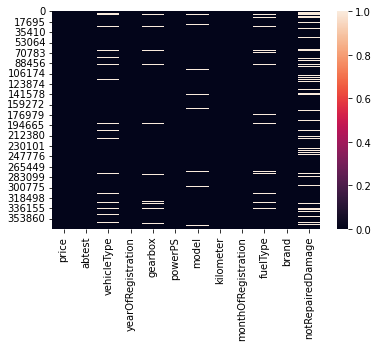

In [64]:
sns.heatmap(base.isnull())

In [65]:
base.loc[pd.isnull(base['vehicleType'])]

,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage
0,480,test,NaN,1993,manuell,0,golf,150000,0,benzin,volkswagen,NaN
16,300,test,NaN,2016,NaN,60,polo,150000,0,benzin,volkswagen,NaN
22,2900,test,NaN,2018,manuell,90,meriva,150000,5,benzin,opel,nein
26,5555,control,NaN,2017,manuell,125,c4,125000,4,NaN,citroen,nein
31,899,control,NaN,2016,manuell,60,clio,150000,6,benzin,renault,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
371495,180,control,NaN,1995,NaN,0,NaN,125000,3,benzin,opel,NaN
371504,2600,control,NaN,2005,automatik,0,c_klasse,150000,9,NaN,mercedes_benz,NaN
371509,1900,test,NaN,2000,manuell,110,NaN,150000,7,NaN,volkswagen,nein
371519,5250,control,NaN,2016,automatik,150,159,150000,12,NaN,alfa_romeo,nein


In [66]:
base['vehicleType'].value_counts()

limousine     93614
kleinwagen    78014
kombi         65921
bus           29699
cabrio        22509
coupe         18386
suv           14477
andere         3125
Name: vehicleType, dtype: int64

In [67]:
valores = {'vehicleType': 'limousine', 'gearbox': 'manuell',
           'model': 'golf', 'fuelType': 'benzin',
           'notRepairedDamage': 'nein'}
base = base.fillna(value = valores)

In [68]:
base.loc[pd.isnull(base['notRepairedDamage'])]

,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage


In [69]:
previsores = base.iloc[:, 1:13].values
preco_real = base.iloc[:, 0].values

In [70]:
previsores

array([['test', 'limousine', 1993, ..., 'benzin', 'volkswagen', 'nein'],
       ['test', 'coupe', 2011, ..., 'diesel', 'audi', 'ja'],
       ['test', 'suv', 2004, ..., 'diesel', 'jeep', 'nein'],
       ...,
       ['test', 'bus', 1996, ..., 'diesel', 'volkswagen', 'nein'],
       ['test', 'kombi', 2002, ..., 'diesel', 'volkswagen', 'nein'],
       ['control', 'limousine', 2013, ..., 'benzin', 'bmw', 'nein']],
      dtype=object)

In [71]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [72]:
onehotencoder = ColumnTransformer(transformers = [("OneHot", OneHotEncoder(),
                                                   [0,1,3,5,8,9,10])], 
                                  remainder = 'passthrough')
previsores = onehotencoder.fit_transform(previsores).toarray()

In [73]:
previsores = torch.tensor(previsores, dtype = torch.float)
preco_real = torch.tensor(preco_real, dtype = torch.float).view(-1, 1)

In [74]:
regressor = nn.Sequential(nn.Linear(316, 158),
                            nn.ReLU(),
                            nn.Linear(158,158),
                            nn.ReLU(),
                            nn.Linear(158,1)) # Regressão não precisa de ativação

In [75]:
criterion = nn.L1Loss()

In [76]:
optimizer = optim.Adam(regressor.parameters())

In [77]:
dataset = torch.utils.data.TensorDataset(previsores, preco_real)
train_loader = torch.utils.data.DataLoader(dataset, batch_size=300, shuffle=True)

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [79]:
regressor.to(device)

Sequential(
  (0): Linear(in_features=316, out_features=158, bias=True)
  (1): ReLU()
  (2): Linear(in_features=158, out_features=158, bias=True)
  (3): ReLU()
  (4): Linear(in_features=158, out_features=1, bias=True)
)

In [80]:
for epoch in range(100):
    running_loss = 0
    running_mae = 0

    for i, data in enumerate(train_loader):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = regressor.forward(inputs)

        mae = F.l1_loss(outputs,labels).item()

        running_mae += mae

        loss = criterion(outputs, labels)

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

        print(f'Época {epoch+1} - Loop: {i+1} de {len(preco_real)//300}  - Perda: {loss} - MAE: {mae}')
    
    print(f'Época {epoch+1} - Perda: {running_loss/len(train_loader)} - MAE: {running_mae/len(train_loader)}')

Época 1 - Loop: 1 de 1197  - Perda: 6136.03369140625 - MAE: 6136.03369140625
Época 1 - Loop: 2 de 1197  - Perda: 5353.35107421875 - MAE: 5353.35107421875
Época 1 - Loop: 3 de 1197  - Perda: 4496.60546875 - MAE: 4496.60546875
Época 1 - Loop: 4 de 1197  - Perda: 5171.380859375 - MAE: 5171.380859375
Época 1 - Loop: 5 de 1197  - Perda: 5409.99267578125 - MAE: 5409.99267578125
Época 1 - Loop: 6 de 1197  - Perda: 6065.015625 - MAE: 6065.015625
Época 1 - Loop: 7 de 1197  - Perda: 4835.8603515625 - MAE: 4835.8603515625
Época 1 - Loop: 8 de 1197  - Perda: 4532.98388671875 - MAE: 4532.98388671875
Época 1 - Loop: 9 de 1197  - Perda: 5370.04833984375 - MAE: 5370.04833984375
Época 1 - Loop: 10 de 1197  - Perda: 4782.44921875 - MAE: 4782.44921875
Época 1 - Loop: 11 de 1197  - Perda: 4826.18212890625 - MAE: 4826.18212890625
Época 1 - Loop: 12 de 1197  - Perda: 5251.103515625 - MAE: 5251.103515625
Época 1 - Loop: 13 de 1197  - Perda: 5697.095703125 - MAE: 5697.095703125
Época 1 - Loop: 14 de 1197  - P

In [81]:
regressor.eval()

Sequential(
  (0): Linear(in_features=316, out_features=158, bias=True)
  (1): ReLU()
  (2): Linear(in_features=158, out_features=158, bias=True)
  (3): ReLU()
  (4): Linear(in_features=158, out_features=1, bias=True)
)

In [82]:
previsoes = regressor.forward(previsores.to(device))

In [83]:
previsoes

tensor([[  773.1946],
        [ 9704.3535],
        [12417.3877],
        ...,
        [ 6409.1421],
        [ 3210.6724],
        [25420.3145]], grad_fn=<AddmmBackward0>)

In [84]:
preco_real

tensor([[  480.],
        [18300.],
        [ 9800.],
        ...,
        [ 9200.],
        [ 3400.],
        [28990.]])

In [85]:
preco_real.mean()

tensor(5916.8340)

In [86]:
previsoes.mean()

tensor(5038.3247, grad_fn=<MeanBackward0>)

In [87]:
preco_real.mean() - previsoes.mean()

tensor(-878.5093, grad_fn=<SubBackward0>)